<a href="https://colab.research.google.com/github/JSchoonmaker/blockchain_projects/blob/main/Anomaly_Detection_in_CryptoPunks_Transactions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Anomaly Detection in CryptoPunks Transactions

by Jeanna Schoonmaker
Nov 2021

In [1]:
!pip install pyod # pkg used for outlier detection

     |████████████████████████████████| 113 kB 5.5 MB/s 
  Created wheel for pyod: filename=pyod-0.9.5-py3-none-any.whl size=132699 sha256=6409b348e1a5240384fc5899d16dcebb46b66a163e1c3829a242b2ac7663f8ee
  Stored in directory: /root/.cache/pip/wheels/3d/bb/b7/62b60fb451b33b0df1ab8006697fba7a6a49709a629055cf77
Successfully built pyod


In [2]:
%load_ext google.colab.data_table

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import numpy as np
import matplotlib

from pyod.models.iforest import IForest
from pyod.utils.data import generate_data

from pyod.utils.data import evaluate_print
from pyod.utils.example import visualize

from datetime import datetime, timedelta
import math

In [4]:
punks_url = 'https://raw.githubusercontent.com/Omni-Analytics-Group/eth-data-science-course/master/courses/Module%201/punks.csv'
punks_2021_url = 'https://raw.githubusercontent.com/JSchoonmaker/blockchain_projects/main/punks_2021.csv'

In [5]:
df = pd.read_csv(punks_url, encoding='unicode_escape')
df_2021 = pd.read_csv(punks_2021_url, encoding='unicode_escape') 

In [6]:
df.head(10)

,Transaction,From,To,Crypto,USD,Txn,ID,Sex,Type,Skin,Slots,Rank
0,Sold,0xf5099e,14715954,25.00,2822.0,2018-11-30,0,Girl,Female,Mid,3,3682560000%
1,Sold,0x00d7c9,10528156,1.60,386.0,2017-07-07,0,Girl,Female,Mid,3,3682560000%
2,Sold,0xc352b5,55241,0.98,320.0,2017-06-23,0,Girl,Female,Mid,3,3682560000%
3,Claimed,NaN,12800693,NaN,NaN,2017-06-23,0,Girl,Female,Mid,3,3682560000%
4,Sold,EliteCat,0xcf6165,60.00,36305.0,2020-11-30,1,Guy,Male,Dark,2,2050240500%
5,Sold,0xf5099e,GoWest23,31.00,5155.0,2019-04-06,1,Guy,Male,Dark,2,2050240500%
6,Sold,0xc352b5,0xa0a59c,0.42,107.0,2017-06-26,1,Guy,Male,Dark,2,2050240500%
7,Claimed,NaN,0xc352b5,NaN,NaN,2017-06-23,1,Guy,Male,Dark,2,2050240500%
8,Claimed,NaN,12800693,NaN,NaN,2017-06-23,2,Girl,Female,Light,1,1716480000%
9,Claimed,NaN,12800693,NaN,NaN,2017-06-23,3,Guy,Male,Dark,3,2488068000%


In [7]:
df_2021.head(10)

,index,txn_type,from,to,date,eth,punk_id,type_str,USD
0,0,Transfer,0xc352b5,alien635â¦,2021-06-09,0.0,2,Female,0.0
1,1,Transfer,0xe34bde,0xfd9065,2021-02-04,0.0,5,Female,0.0
2,2,Transfer,0xc352b5,0xe34bde,2021-02-04,0.0,5,Female,0.0
3,3,Transfer,0xc352b5,alien635â¦,2021-06-09,0.0,30,Male,0.0
4,4,Transfer,0x5ea968,gary.veeâ¦,2021-08-13,0.0,32,Male,0.0
5,5,Transfer,DANNY,0x5ea968,2021-02-18,0.0,32,Male,0.0
6,6,Transfer,0xc352b5,DANNY,2021-02-18,0.0,32,Male,0.0
7,7,Transfer,0xe34bde,0xfd9065,2021-02-04,0.0,39,Male,0.0
8,8,Transfer,0xc352b5,0xe34bde,2021-02-04,0.0,39,Male,0.0
9,9,Transfer,0xe34bde,0xfd9065,2021-02-04,0.0,49,Female,0.0


In [8]:
df_6276 = df_2021.loc[df_2021['punk_id'] == 6276]

In [9]:
df_6276.sort_values(by=['date', 'index', 'USD'])

,index,txn_type,from,to,date,eth,punk_id,type_str,USD
12596,12596,Sold,0x033ee7,tonyherrâ¦,2021-01-30,4.89,6276,Male,6717.052192
12595,12595,Sold,tonyherrâ¦,0xd84e80,2021-02-11,6.00,6276,Male,10702.170607
12594,12594,Transfer,0xd84e80,0x8f6b1e,2021-02-15,0.00,6276,Male,0.000000
12593,12593,Sold,0x8f6b1e,0x20af8c,2021-02-21,13.65,6276,Male,26407.532983
12590,12590,Sold,0x4dea06,0x1f5f63,2021-03-17,22.50,6276,Male,41043.389737
12591,12591,Transfer,0x4dea06,0xc4988e,2021-03-17,0.00,6276,Male,0.000000
12592,12592,Sold,0x20af8c,0x4dea06,2021-03-17,21.94,6276,Male,40021.865370
12588,12588,Transfer,wookie.eâ¦,0x47bab6,2021-03-18,0.00,6276,Male,0.000000
12589,12589,Sold,0x1f5f63,wookie.eâ¦,2021-03-18,21.00,6276,Male,37294.454371
12587,12587,Transfer,sillytunâ¦,0x1011ce,2021-05-03,0.00,6276,Male,0.000000


In [10]:
df['Txn']= pd.to_datetime(df['Txn'])
df_2021['date'] = pd.to_datetime(df_2021['date'])

In [11]:
df.drop(columns=['Sex', 'Skin', 'Slots', 'Rank'], inplace=True)
df_punks = df[df['Transaction'] == 'Sold'].copy()
df_punks.fillna(0, inplace=True)

In [67]:
df_punks.count()

Transaction    7554
From           7554
To             7554
Crypto         7554
USD            7554
ID             7554
Type           7554
count_5days    7554
y_pred         7554
y_scores       7554
dtype: int64

[Text(0.5, 1.0, 'Punks Sales thru 2020')]

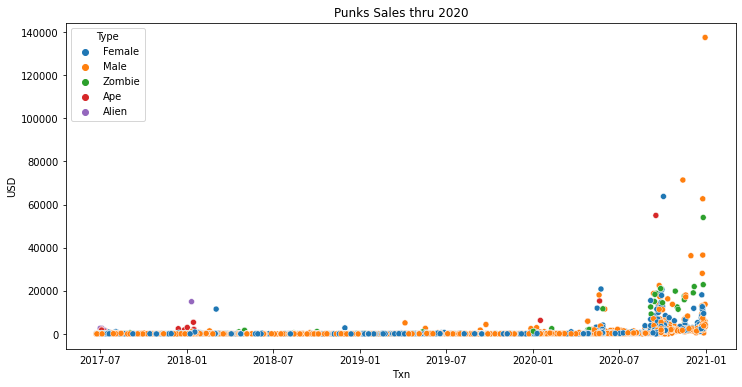

In [12]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x=df_punks.Txn, y=df_punks.USD, hue = df_punks.Type).set(title='Punks Sales thru 2020')

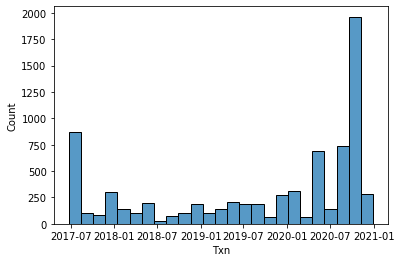

In [13]:
sns.histplot(df_punks.Txn, bins=25)

In [14]:
df_new_2021 = df_2021[['from', 'to', 'txn_type', 'date', 'punk_id', 'eth', 'USD', 'type_str']]

In [15]:
df_new = df_new_2021.rename(columns={'type_str': 'type'})

### For now, let's just look at sales

In [16]:
df_sales = df_new_2021[df_new_2021['txn_type']== 'Sold'].copy()

In [17]:
df_sales.dtypes

from                object
to                  object
txn_type            object
date        datetime64[ns]
punk_id              int64
eth                float64
USD                float64
type_str            object
dtype: object

In [18]:
df_sales

,from,to,txn_type,date,punk_id,eth,USD,type_str
13,0xb813c6,0xe20388,Sold,2021-08-23,53,129.99,431837.735666,Female
15,0xdcf227,jmg,Sold,2021-02-19,53,22.00,43065.000000,Female
16,0xc352b5,0xdcf227,Sold,2021-02-01,53,20.00,27360.802740,Female
52,0x436a4a,0x9179de,Sold,2021-05-04,118,20.45,66322.737501,Female
53,0x394547,0x436a4a,Sold,2021-03-11,118,20.25,36924.434169,Female
...,...,...,...,...,...,...,...,...
20946,0xddfdcb,0x3689df,Sold,2021-08-15,9990,0.01,33.113622,Male
20947,0xca8fe4,0xddfdcb,Sold,2021-03-20,9990,24.50,44222.068405,Male
20957,3van.eth,0x0e4437,Sold,2021-02-08,9997,99.99,175375.547521,Zombie
20959,0xcfd9cc,0xef764bâ¦,Sold,2021-08-11,9998,110.00,347952.194174,Female


In [19]:
df_jan_may = df_sales[df_sales['date'] <= '2021-05-30'].copy()

In [20]:
df_jan_may

,from,to,txn_type,date,punk_id,eth,USD,type_str
15,0xdcf227,jmg,Sold,2021-02-19,53,22.00,43065.000000,Female
16,0xc352b5,0xdcf227,Sold,2021-02-01,53,20.00,27360.802740,Female
52,0x436a4a,0x9179de,Sold,2021-05-04,118,20.45,66322.737501,Female
53,0x394547,0x436a4a,Sold,2021-03-11,118,20.25,36924.434169,Female
64,0x84c920,0xf25e63,Sold,2021-03-08,124,19.90,36435.859871,Male
...,...,...,...,...,...,...,...,...
20927,0xca8fe4,scalynelâ¦,Sold,2021-01-06,9974,10.00,12088.309376,Female
20933,niwin,0xb166dd,Sold,2021-01-27,9979,6.20,7750.314691,Male
20947,0xca8fe4,0xddfdcb,Sold,2021-03-20,9990,24.50,44222.068405,Male
20957,3van.eth,0x0e4437,Sold,2021-02-08,9997,99.99,175375.547521,Zombie


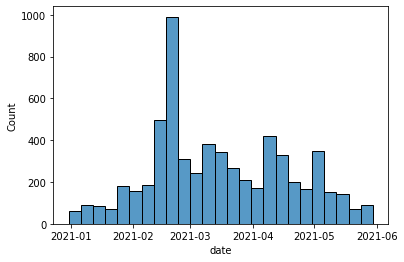

In [21]:
sns.histplot(x=df_jan_may.date, bins=25)

In [22]:
df_jun_on = df_new[df_new['date']>= '2021-06-01'].copy()

(array([737942., 737956., 737972., 737986., 738003., 738017., 738034.,
        738048., 738064.]), <a list of 9 Text major ticklabel objects>)

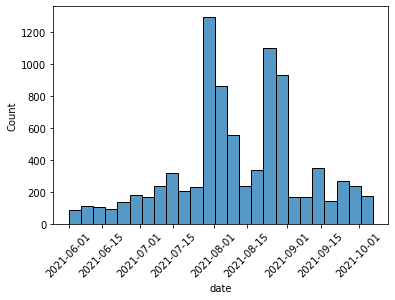

In [23]:
sns.histplot(df_jun_on.date, bins=25)
plt.xticks(rotation=45)

Text(0.5, 1.0, 'CryptoPunks Sales Counts by Date')

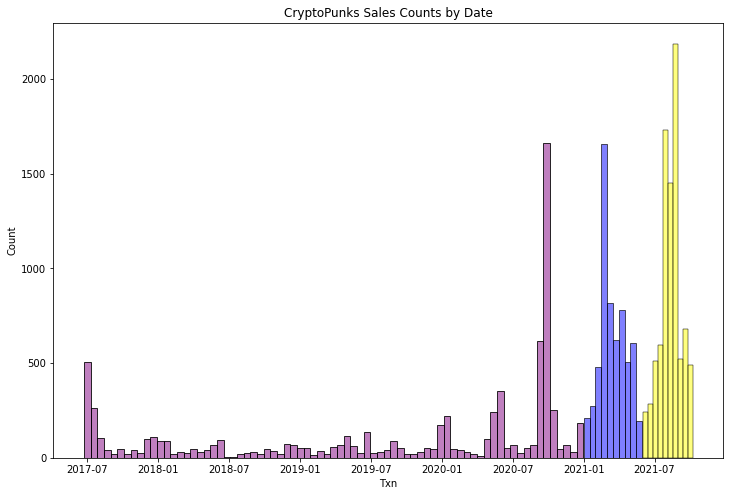

In [24]:
plt.figure(figsize=(12,8))
sns.histplot(df_punks.Txn, bins=75, alpha=0.5, label="Punks thru 2020", color='purple')
sns.histplot(df_jan_may.date, bins=10, alpha=0.5, label="Punks Jan Jun 2021", color='blue')
sns.histplot(df_jun_on.date, bins=10, alpha=0.5, label="Punks Jul On 2021", color='yellow')
plt.title('CryptoPunks Sales Counts by Date')

### After the initial release, there are 3 distinct periods of heavy buying and selling: fall 2020, early spring 2021, and summer/early fall 2021.

### These are the 3 date ranges we will work with for our analysis.

Text(0.5, 1.0, 'CryptoPunks Sales Counts by Date')

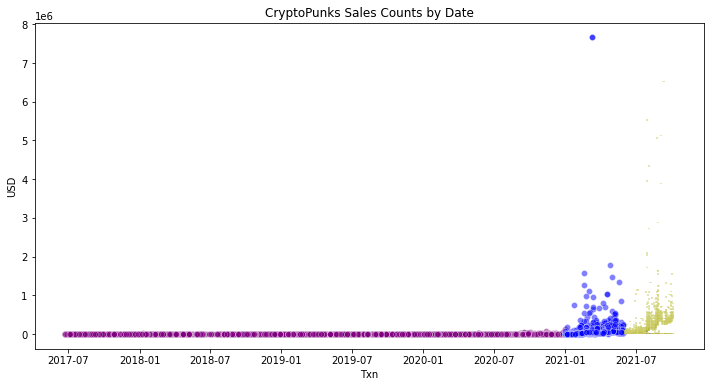

In [25]:
plt.figure(figsize=(12,6))
sns.scatterplot(x=df_punks.Txn, y=df_punks.USD, alpha=0.5, color='purple')
sns.scatterplot(x=df_jan_may.date, y=df_jan_may.USD, alpha=0.5, color='blue')
sns.histplot(x=df_jun_on.date, y=df_jun_on.USD, alpha=0.5, color='yellow')
plt.title('CryptoPunks Sales Counts by Date')

## 1. Let's create a subset dataframe that includes only the From, To, and ID fields.

In [26]:
wash_check = df_punks[['From', 'To', 'ID']].copy()

## 2. Next, we'll check for transactions where the same seller sold a Punk multiple times OR the same buyer bought a Punk multiple times, and we'll put those Punk IDs into a list for further analysis.

Note: this will only identify traders who transact on the same Punk multiple times. Due to the anonymous nature of wallets, it is possible that other trades are wash trades that aren't detectable through this process. It's also possible none of these transactions constitute wash trades.

In [66]:
dupes = wash_check[wash_check.duplicated(['From', 'ID'])]
suss_ids = dupes['ID'].tolist()

dupes2 = wash_check[wash_check.duplicated(['To', 'ID'])]
suss_ids2 = dupes2['ID'].tolist()

all_suss = suss_ids + suss_ids2

print('The number of transactions we want to examine from 2020 and before further is:')
print(len(all_suss))
len(set(all_suss))

The number of transactions we want to examine from 2020 and before further is:
135


74

In [68]:
135/7554

0.017871326449563147

In [28]:
wash_check1 = df_jan_may[['from', 'to', 'punk_id']].copy()
dupes3 = wash_check1[wash_check1.duplicated(['from', 'punk_id'])]
suss_ids3 = dupes3['punk_id'].tolist()

dupes4 = wash_check1[wash_check1.duplicated(['to', 'punk_id'])]
suss_ids4 = dupes4['punk_id'].tolist()

all_suss2 = suss_ids3 + suss_ids4

print('The number of Punks with transactions we want to examine from Jan - May 2021 further is:')
len(all_suss2)

The number of Punks with transactions we want to examine from Jan - May 2021 further is:


23

In [29]:
wash_check2 = df_jun_on[['from', 'to', 'punk_id']].copy()
dupes5 = wash_check2[wash_check2.duplicated(['from', 'punk_id'])]
suss_ids5 = dupes5['punk_id'].tolist()

dupes6 = wash_check2[wash_check2.duplicated(['to', 'punk_id'])]
suss_ids6 = dupes6['punk_id'].tolist()

all_suss3 = suss_ids5 + suss_ids6
all_suss3 = set(all_suss3)

print('The number of Punks with transactions we want to examine from Jul 2021 and on further is:')
len(all_suss3)

The number of Punks with transactions we want to examine from Jul 2021 and on further is:


411

In [30]:
print(all_suss3)

{2055, 8199, 4109, 2068, 4130, 8237, 2102, 4152, 6213, 6217, 4169, 4171, 2127, 2128, 4185, 2142, 4190, 6238, 8292, 4204, 2174, 4226, 4227, 6276, 8322, 6292, 8358, 8372, 8375, 8378, 2235, 2236, 2238, 6334, 6335, 4293, 8389, 2250, 8396, 4302, 8399, 2257, 211, 8408, 6372, 229, 2280, 6379, 6380, 239, 8436, 8444, 259, 6412, 8474, 6434, 6443, 8492, 4399, 6448, 8495, 308, 8501, 339, 341, 352, 2401, 8548, 6506, 6507, 6509, 2417, 6517, 2430, 8574, 8576, 8577, 2438, 6534, 2440, 6538, 8586, 4493, 406, 4503, 4511, 416, 2480, 6578, 445, 6593, 8643, 2505, 2511, 2517, 2523, 2524, 8667, 6622, 6620, 2529, 6630, 4590, 6641, 2547, 2550, 4601, 6652, 6655, 6662, 2577, 4634, 4639, 4640, 6688, 6698, 6709, 4663, 4670, 2634, 2637, 6734, 6747, 6748, 8798, 607, 610, 6755, 613, 8807, 628, 6777, 2697, 2699, 4756, 2710, 2714, 4765, 2727, 8874, 2735, 4795, 4798, 6854, 8913, 4824, 729, 4826, 8922, 2782, 6879, 2791, 6888, 8937, 8938, 2795, 4843, 750, 751, 6913, 2822, 2825, 8970, 4879, 2834, 6933, 4892, 803, 807, 4914,

## 135 transactions from the fall of 2020 meet the criteria, involving 74 Punks. There were 7,554 transactions in the dataset, so roughly 1.8% of the transactions merit further analysis.

## 3. Now that we have a list of Punk IDs, let's create a new dataframe that shows all transactions associated with those IDs.

In [31]:
boolean_check = df_punks.ID.isin(all_suss)
df_p = df_punks[boolean_check]
df_p.sort_values(by=['ID', 'Txn', 'Crypto']).head(25)

,Transaction,From,To,Crypto,USD,Txn,ID,Type
1608,Sold,0xb6be4d,Pranksy,0.90,182.0,2020-05-22,1360,Male
1607,Sold,Pranksy,capital_,1.00,232.0,2020-07-02,1360,Male
1605,Sold,Pranksy,MrNFT,1.75,603.0,2020-09-12,1360,Male
1606,Sold,capital_,evkort,1.89,679.0,2020-09-13,1360,Male
1604,Sold,MrNFT,CryptoPa,2.17,738.0,2020-09-23,1360,Male
2404,Sold,0x8234be,0x0a4eaf,0.25,75.0,2017-08-16,1845,Male
2403,Sold,LSD,Lmao,5.00,1766.0,2020-10-05,1845,Male
2402,Sold,Lmao,Party,3.52,1236.0,2020-10-08,1845,Male
2401,Sold,Party,Collin3,4.25,1493.0,2020-10-08,1845,Male
2400,Sold,Collin3,Party,1.95,935.0,2020-11-17,1845,Male


## 4. Looking through the Punks transactions, it seems some names/wallet addresses show up often. Let's get a list of all accounts showing in the From/To fields of the specified transactions and then filter it to accounts that show up at least 10 times.

In [32]:
accounts = df_p['From'].to_list() + df_p['To'].to_list()
most_common = Counter(accounts).most_common()
most_common = [x for x in most_common if x[1]>10]
most_common

[('Pranksy', 165),
 ('0x5aaeb9', 32),
 ('Hemba', 26),
 ('MrNFT', 24),
 ('0x00d7c9', 21),
 ('Carlini8', 20),
 ('natealex', 18),
 ('Dude_Nak\x85', 18),
 ('0x11c9a7', 17),
 ('evkort', 16),
 ('ross_VRO\x85', 14),
 ('Goop', 14),
 ('NeonNFT', 12),
 ('Zieg', 11)]

## 5. With Pranksy showing up the most often in this list, let's take a closer look at a couple of Pranksy's Punks transactions

***NOTE: After a quick google search, it seems Pranksy is an active NFT collector and early adopter. Analyzing the transaction history is not meant to be an accusation of Pranksy or any other accounts mentioned in the analysis.**

In [33]:
pranksy_ids = df_punks.loc[df_punks['From'] == 'Pranksy'].ID.to_list()

In [34]:
pranksy_ids[105:110]

[3241, 3244, 3260, 3260, 3279]

In [35]:
df_punks.loc[df_punks['ID'] == 3260].sort_values(by=['Txn', 'Crypto'])

,Transaction,From,To,Crypto,USD,Txn,ID,Type
5149,Sold,Hemba,Pranksy,1.80,613.0,2020-09-22,3260,Male
5148,Sold,Pranksy,0x5aaeb9,2.19,757.0,2020-09-24,3260,Male
5147,Sold,0x5aaeb9,0xef764b,2.29,792.0,2020-09-24,3260,Male
5146,Sold,0xef764b,Pranksy,3.99,1427.0,2020-09-28,3260,Male
5145,Sold,Pranksy,0x13816f,4.79,1714.0,2020-09-28,3260,Male


## Let's look at Punk 3260's transaction history, step by step

#### a. Starting at the top of the table, you can see that Hemba was Punk 3260's first owner. On 9/22/20, Pranksy purchased 3260 for 1.8 Eth ('Crypto'), which was equivalent to $613.

#### b. Two days later on 9/24, Pranksy sold 3260 to 0x5aaeb9 for 2.19 Eth or $757.

#### c. On that same day, 9/24, 0x5aaeb9 sold 3260 to 0xef764b for 2.29 Eth/$792. 

#### d. Four days later, on 9/28/20, 0xef764b sold 3260 back to Pranksy for 3.99 Eth, or $1427. 

#### e. Later that same day, Pranksy sold 3260 to 0x13816f for 4.79 Eth, or $1714.

### See additional examples below, both of which also include sales to and from Pranksy to 0x5aaeb9.

In [36]:
df_punks.loc[df_punks['ID'] == 2880].sort_values(by=['Txn', 'Crypto'])

,Transaction,From,To,Crypto,USD,Txn,ID,Type
4337,Sold,Hemba,Pranksy,1.80,613.0,2020-09-22,2880,Male
4336,Sold,Pranksy,0x5aaeb9,2.19,757.0,2020-09-24,2880,Male
4335,Sold,0x5aaeb9,Pranksy,2.29,792.0,2020-09-24,2880,Male
4334,Sold,Pranksy,MrNFT,2.75,948.0,2020-09-25,2880,Male
4333,Sold,MrNFT,wolong,2.98,1014.0,2020-09-25,2880,Male
4332,Sold,wolong,gCAN,3.25,1543.0,2020-11-19,2880,Male
4331,Sold,gCAN,0x6ef237,5.50,3495.0,2020-12-26,2880,Male


In [37]:
df_punks.loc[df_punks['ID'] == 6112].sort_values(by=['Txn', 'Crypto'])

,Transaction,From,To,Crypto,USD,Txn,ID,Type
10501,Sold,Hemba,0x5e7ee9,2.30,796.0,2020-09-24,6112,Male
10500,Sold,0x5e7ee9,0x5aaeb9,2.70,948.0,2020-09-24,6112,Male
10499,Sold,0x5aaeb9,zonted,2.90,1001.0,2020-09-25,6112,Male
10498,Sold,zonted,Pranksy,3.95,1413.0,2020-09-28,6112,Male
10497,Sold,Pranksy,Synpat,4.60,1672.0,2020-09-28,6112,Male
10496,Sold,Synpat,0x13816f,4.99,1737.0,2020-10-04,6112,Male


In [38]:
df_punks.loc[df_punks['ID'] == 6755].sort_values(by=['Txn', 'Crypto'])

,Transaction,From,To,Crypto,USD,Txn,ID,Type
11729,Sold,Hemba,Pranksy,1.80,613.0,2020-09-22,6755,Male
11728,Sold,Pranksy,0x5aaeb9,2.19,757.0,2020-09-24,6755,Male
11727,Sold,0x5aaeb9,Pranksy,2.29,792.0,2020-09-24,6755,Male
11726,Sold,Pranksy,0xe4c479,2.75,937.0,2020-09-25,6755,Male
11725,Sold,0xe4c479,0x033ee7,2.90,1031.0,2020-09-26,6755,Male


### To be fair, while Pranksy was a part of a lot of transactions we are analyzing, there were also transactions that don't seem to have any suspicious behavior, like the one below. 

### It is worth remembering that early adopters of NFTs were often active in their communities and their repeated participation may be attributed to nothing more than excitement at being early in the hype cycle.

In [39]:
pranksy_ids[115:120]

[3338, 3379, 3383, 3386, 3391]

In [40]:
df_punks.loc[df_punks['ID'] == 3379].sort_values(by=['Txn', 'Crypto'])

,Transaction,From,To,Crypto,USD,Txn,ID,Type
5411,Sold,0x00d7c9,0x3d826e,0.10,136.0,2018-01-14,3379,Male
5410,Sold,0x3d826e,Pranksy,3.00,1906.0,2020-12-26,3379,Male
5409,Sold,Pranksy,0xb4d0e8,5.35,3678.0,2020-12-28,3379,Male


## For more examples of anomalous transactions, uncomment and run the cells below.

In [44]:
df_punks.loc[df_punks['ID'] == 4200].sort_values(by=['Txn', 'Crypto'])

,Transaction,From,To,Crypto,USD,Txn,ID,Type
7068,Sold,0x00d7c9,antunes_,0.30,52.0,2019-09-28,4200,Female
7067,Sold,antunes_,Michel_M,0.35,51.0,2019-11-25,4200,Female
7066,Sold,Michel_M,_K_A_M_I,0.56,124.0,2020-02-26,4200,Female
7065,Sold,_K_A_M_I,Pranksy,0.98,204.0,2020-05-24,4200,Female
7063,Sold,Pranksy,Matthew_,1.25,460.0,2020-09-11,4200,Female
7064,Sold,ChrisR,Pranksy,1.29,470.0,2020-09-11,4200,Female
7062,Sold,Matthew_,friskynf,2.10,803.0,2020-09-18,4200,Female


In [45]:
df_punks.loc[df_punks['ID'] == 8512].sort_values(by=['Txn', 'Crypto'])

,Transaction,From,To,Crypto,USD,Txn,ID,Type
14901,Sold,0xb6be4d,PM_disco,1.20,276.0,2020-06-26,8512,Female
14900,Sold,PM_disco,Carlini8,1.90,716.0,2020-09-14,8512,Female
14899,Sold,Carlini8,0x067034,2.50,946.0,2020-09-19,8512,Female
14898,Sold,0x067034,0xe4c479,2.99,1137.0,2020-09-20,8512,Female
14897,Sold,0xe4c479,Carlini8,3.80,1355.0,2020-09-28,8512,Female
14896,Sold,Carlini8,Pranksy,3.99,1427.0,2020-09-28,8512,Female
14895,Sold,Pranksy,Carlini8,4.99,1812.0,2020-09-28,8512,Female
14894,Sold,Carlini8,Alex3422,5.25,1906.0,2020-09-28,8512,Female
14893,Sold,Alex3422,kyloren,5.70,2012.0,2020-09-29,8512,Female
14892,Sold,Pranksy,0xcf6165,4.49,2886.0,2020-12-26,8512,Female


In [43]:
df_punks.loc[df_punks['ID'] == 9922].sort_values(by=['Txn', 'Crypto'])

,Transaction,From,To,Crypto,USD,Txn,ID,Type
17422,Sold,0x20e386,CPyrc,1.20,465.0,2020-09-13,9922,Male
17421,Sold,CPyrc,Pranksy,1.75,659.0,2020-09-14,9922,Male
17420,Sold,Pranksy,0x11c9a7,1.88,690.0,2020-09-15,9922,Male
17419,Sold,0x11c9a7,Michel_M,1.98,673.0,2020-09-23,9922,Male
17418,Sold,Michel_M,0x3ba9cd,2.15,729.0,2020-09-23,9922,Male
17417,Sold,0x3ba9cd,CPyrc,3.15,1131.0,2020-09-27,9922,Male
17416,Sold,CPyrc,0x11c9a7,3.49,1254.0,2020-09-28,9922,Male
17415,Sold,0x11c9a7,0x13816f,3.71,1323.0,2020-09-28,9922,Male


In [46]:
df_punks.loc[df_punks['ID'] == 1845].sort_values(by=['Txn', 'Crypto'])

,Transaction,From,To,Crypto,USD,Txn,ID,Type
2404,Sold,0x8234be,0x0a4eaf,0.25,75.0,2017-08-16,1845,Male
2403,Sold,LSD,Lmao,5.00,1766.0,2020-10-05,1845,Male
2402,Sold,Lmao,Party,3.52,1236.0,2020-10-08,1845,Male
2401,Sold,Party,Collin3,4.25,1493.0,2020-10-08,1845,Male
2400,Sold,Collin3,Party,1.95,935.0,2020-11-17,1845,Male


In [53]:
df_reset = df_new.reset_index()

In [56]:
df_new.loc[df_new['punk_id'] == 6276].sort_values(by=['date', 'eth', 'USD'])

,from,to,txn_type,date,punk_id,eth,USD,type
12596,0x033ee7,tonyherrâ¦,Sold,2021-01-30,6276,4.89,6717.052192,Male
12595,tonyherrâ¦,0xd84e80,Sold,2021-02-11,6276,6.00,10702.170607,Male
12594,0xd84e80,0x8f6b1e,Transfer,2021-02-15,6276,0.00,0.000000,Male
12593,0x8f6b1e,0x20af8c,Sold,2021-02-21,6276,13.65,26407.532983,Male
12591,0x4dea06,0xc4988e,Transfer,2021-03-17,6276,0.00,0.000000,Male
12592,0x20af8c,0x4dea06,Sold,2021-03-17,6276,21.94,40021.865370,Male
12590,0x4dea06,0x1f5f63,Sold,2021-03-17,6276,22.50,41043.389737,Male
12588,wookie.eâ¦,0x47bab6,Transfer,2021-03-18,6276,0.00,0.000000,Male
12589,0x1f5f63,wookie.eâ¦,Sold,2021-03-18,6276,21.00,37294.454371,Male
12587,sillytunâ¦,0x1011ce,Transfer,2021-05-03,6276,0.00,0.000000,Male


### Now that we've had a chance to identify odd looking transactions through our human-in-the-loop process, let's train an unsupervised model to find anomalous transactions.


In [57]:
df_punks = df_punks.set_index('Txn')
df_punks = df_punks.sort_index()
df_punks

,Transaction,From,To,Crypto,USD,ID,Type
Txn,,,,,,,
2017-06-23,Sold,5966219,9734672,0.30,98.0,5633,Male
2017-06-23,Sold,5966219,22324,0.11,35.0,6318,Male
2017-06-23,Sold,0x5b098b,48442,0.03,10.0,6548,Male
2017-06-23,Sold,5966219,0xe45df5,0.09,29.0,6934,Male
2017-06-23,Sold,Pranksy,GoWest23,0.75,101.0,4919,Male
...,...,...,...,...,...,...,...
2020-12-30,Sold,0xb6be4d,TweetyPi,5.39,3901.0,9322,Male
2020-12-30,Sold,644479,0x1f5a39,4.56,3344.0,7335,Male
2020-12-30,Sold,0x98cfea,Cry,8.00,5852.0,3073,Male


### Creating a count of transactions within a 5 day window per Punk

In [58]:
df_punks['count_5days'] = df_punks.groupby('ID')['USD'].transform(lambda s: s.rolling(timedelta(days=5)).count())

In [59]:
df_punks

,Transaction,From,To,Crypto,USD,ID,Type,count_5days
Txn,,,,,,,,
2017-06-23,Sold,5966219,9734672,0.30,98.0,5633,Male,1.0
2017-06-23,Sold,5966219,22324,0.11,35.0,6318,Male,1.0
2017-06-23,Sold,0x5b098b,48442,0.03,10.0,6548,Male,1.0
2017-06-23,Sold,5966219,0xe45df5,0.09,29.0,6934,Male,1.0
2017-06-23,Sold,Pranksy,GoWest23,0.75,101.0,4919,Male,1.0
...,...,...,...,...,...,...,...,...
2020-12-30,Sold,0xb6be4d,TweetyPi,5.39,3901.0,9322,Male,1.0
2020-12-30,Sold,644479,0x1f5a39,4.56,3344.0,7335,Male,1.0
2020-12-30,Sold,0x98cfea,Cry,8.00,5852.0,3073,Male,1.0


In [69]:
anomaly_proportion = 0.018

# train IForest detector
clf_name = 'Anomaly Detection - Isolation Forest'
clf = IForest(contamination=anomaly_proportion)

X = df_punks[['count_5days', 'Crypto']]
clf.fit(X)

IForest(behaviour='old', bootstrap=False, contamination=0.018,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=1,
    random_state=None, verbose=0)

In [70]:
df_punks['y_pred'] = clf.labels_ # binary labels (0: inliers, 1: outliers)
df_punks['y_scores'] = clf.decision_scores_ # raw outlier scores. The bigger the number the greater the anomaly.


In [81]:
df_punks['y_pred'].value_counts()

0    7418
1     136
Name: y_pred, dtype: int64

In [71]:
df_punks.sort_values(by=['y_pred'], ascending=False).head(15)

,Transaction,From,To,Crypto,USD,ID,Type,count_5days,y_pred,y_scores
Txn,,,,,,,,,,
2020-09-24,Sold,MrTpunks,DANNY,32.00,10370.0,4020,Male,1.0,1,0.067218
2020-12-25,Sold,0xa3cb30,2pac,60.00,36593.0,3106,Male,1.0,1,0.106283
2020-05-24,Sold,0xf1ad94,DANNY,100.00,20857.0,6487,Female,1.0,1,0.119405
2020-09-28,Sold,0x5e7ee9,Carlini8,3.80,1355.0,4110,Male,5.0,1,0.033324
2020-09-18,Sold,Snowfro,Pranksy,49.00,18887.0,2306,Zombie,1.0,1,0.101417
2020-09-15,Sold,0xc352b5,KingChad,22.00,8176.0,561,Male,1.0,1,0.035401
2020-09-26,Sold,0xe4c479,0x033ee7,2.90,1031.0,8409,Male,5.0,1,0.025103
2020-11-19,Sold,jmg,0xe9e7b8,37.89,18069.0,5690,Male,1.0,1,0.082774
2020-09-14,Sold,0x11c9a7,Carlini8,1.77,667.0,9335,Male,4.0,1,0.000699


### Next, we'll create a graph showing a visualization of the inliers and outliers of our Isolation Forest model, along with the boundaries the model established between normal and anomalous transactions. Note the model weighed the price per transaction just as heavily as it did the count of transactions per 5 day window. In our human in the loop approach, I paid little attention to the price of a transaction simply because the volatility of the NFT market and the lack of established valuations means determining a "normal" amount to pay for an NFT is almost impossible to do.

Text(0, 0.5, 'Crypto spent on transaction')

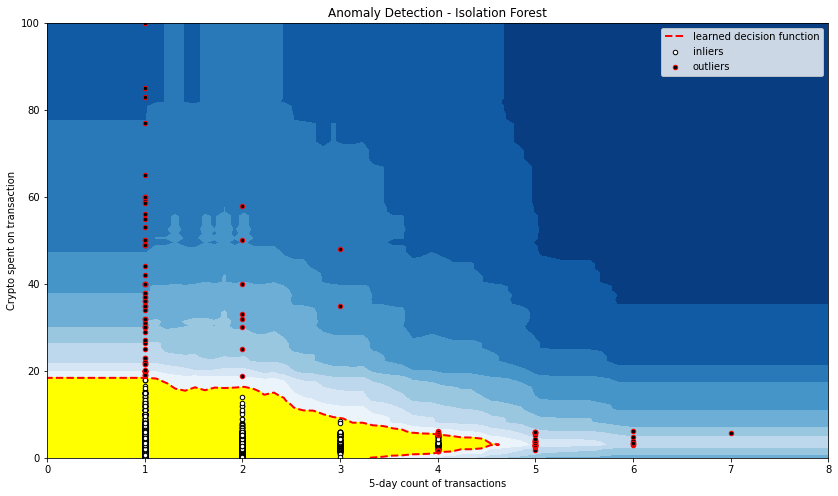

In [84]:
xx , yy = np.meshgrid(np.linspace(0, 10, 100), np.linspace(0, 100, 100))

# decision function calculates the raw anomaly score for every point
Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])*-1
Z = Z.reshape(xx.shape)

threshold = (df_punks.loc[df_punks['y_pred'] == 1, 'y_scores'].min()*-1)/2 + (df_punks.loc[df_punks['y_pred'] == 0, 'y_scores'].max()*-1)/2

plt.figure(figsize=(14, 8))
subplot = plt.subplot(1,1, 1)

# fill blue colormap from minimum anomaly score to threshold value
subplot.contourf(xx, yy, Z, levels = np.linspace(Z.min(), threshold, 10),cmap=plt.cm.Blues_r)

# draw red contour line where anomaly score is equal to threshold
a = subplot.contour(xx, yy, Z, levels=[threshold],linewidths=2, colors='red')

# fill yellow contour lines where range of anomaly score is from threshold to maximum anomaly score
subplot.contourf(xx, yy, Z, levels=[threshold, Z.max()],colors='yellow')

msk = df_punks['y_pred'] == 0
x = df_punks.loc[msk, ['count_5days', 'Crypto']].values

# scatter plot of inliers with white dots
b = subplot.scatter(x[:, 0], x[:, 1], c='white',s=20, edgecolor='k') 

msk = df_punks['y_pred'] == 1
x = df_punks.loc[msk, ['count_5days', 'Crypto']].values

# scatter plot of outliers with black dots
c = subplot.scatter(x[:, 0], x[:, 1], c='black',s=20, edgecolor='r')
subplot.axis('tight')

subplot.legend(
    [a.collections[0], b, c],
    ['learned decision function', 'inliers', 'outliers'],
    prop=matplotlib.font_manager.FontProperties(size=10),
    loc='upper right')

subplot.set_title(clf_name)
subplot.set_xlim((0, 8))
subplot.set_ylim((0, 100))

subplot.set_xlabel("5-day count of transactions")
subplot.set_ylabel("Crypto spent on transaction")


More reading on this topic:

*   https://www.cryptoartnet.com/cryptoart-wash-trading/
*   https://arxiv.org/pdf/2102.07001.pdf
*   https://techcrunch.com/2021/04/08/the-cult-of-cryptopunks/
*   https://www.fxstreet.com/cryptocurrencies/news/analysts-fear-nfts-are-being-used-for-wash-trading-202108271200
*   https://www.okex.com/academy/en/top-nft-cryptopunks - this article quotes Zuppinger, the COO of NonFungible, as saying he did not see evidence of wash trading happening on the cryptopunk market, but instead an "offer and demand" pattern.
*   https://github.com/cryptopunksnotdead/awesome-cryptopunks-bubble


With thanks to Lianne and Justin for their tutorial on unsupervised outlier detection here: https://www.justintodata.com/unsupervised-anomaly-detection-on-bank-transactions-outliers/#:~:text=%20A%20use%20case%20of%20Unsupervised%20Learning%20with,a%20Machine%20Learning%20Algorithm.%20How%20do...%20More%20



